# library imports

In [1]:
import geopandas as gpd
import shapely
import matplotlib.pyplot as plt
import pandas as pd
import plotly.express as px

# import ha district polygons

In [ ]:
district_gpd ＝ pd.read_excel("district_map.xlsx", engine = "openpyxl")

# data clearning

In [47]:
def find_land_use(district, shape_gpd):
    """
    return cutout polygons, cutout area of intersecting zones and road zones, 
    as well as district area and total zoned/planned area within a district using zone map 
    provided by HK Govt
    
        Parameters:
            district (shapely.geometry.Polygon): polygon of a district
            shape_gpd (pd.DataFrame): dataframe containing planned zones 
            in shapely.geometry.Polygon inside a column named "geometry"
        
        Returns:
            cutouts ([shapely.geometry.Polygon]): list of polygons of road zones intersecting
            with district
            cutout.area (double): union area of cutouts
            district.area (double): district area
            zoned (Polygon): union polygon all planned zones within the district
    
    """
    cutouts = []
    cutout = shape_gpd["geometry"][0]
    zoned = shape_gpd["geometry"][0]
    for i in range(1,len(shape_gpd["geometry"])):
        if district.intersects(shape_gpd["geometry"][i]):
            intersect = district.intersection(shape_gpd["geometry"][i])
            zoned = zoned.union(intersect)
            if "Road" in shape_gpd["DESC_ENG"][i]:
                pg = shape_gpd["geometry"][i]
                intersect = district.intersection(pg)
                cutouts.append(intersect)
                cutout = cutout.union(intersect)
                
    # zoned_area = zoned.area
        
    return (cutouts, cutout.area, district.area, zoned)

ABD ABERDEEN Road over zoned area % 0.06547089284877966


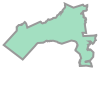

In [48]:
# print(district_gpd["Districtcode"][0], district_gpd["Districtname"][0])
i = 0
(cutouts, cutout_area, district_area, zoned) = find_land_use(district_gpd["geometry"][i], zone_gpd)
print(district_gpd["Districtcode"][i], 
      district_gpd["Districtname"][i],
      "Road over zoned area %",
      cutout_area / zoned.area)
district_gpd["geometry"][i]

In [49]:
df = district_gpd
road_over_zoned = []
for i in range(len(df)):
    # print(i)
    if i % 10 == 0:
        print(f"Finished {i} HA districts")
    cutouts, road, circle, zoned = find_land_use(df["geometry"][i], zone_gpd)
    
    # print(road / zoned, type(road_over_zoned))
    if zoned.area == 0 or road / zoned.area == 0:
        road_over_zoned.append(-1)
    else:
        road_over_zoned.append(road / zoned.area)


Finished 0 HA districts
Finished 10 HA districts
Finished 20 HA districts
Finished 30 HA districts
Finished 40 HA districts
Finished 50 HA districts
Finished 60 HA districts
Finished 70 HA districts
Finished 80 HA districts
Finished 90 HA districts
Finished 100 HA districts
Finished 110 HA districts


In [50]:
len(road_over_zoned)

118

# merging with HA district df

In [99]:
df = district_gpd
df = pd.concat([df, pd.DataFrame({"road_over_zoned": road_over_zoned})], axis = 1)
df["road_over_zoned"] = round(df["road_over_zoned"], 3)

In [100]:
# df = df[df["road_over_zoned"] != -1]

In [101]:
df = df.set_index("Districtname")

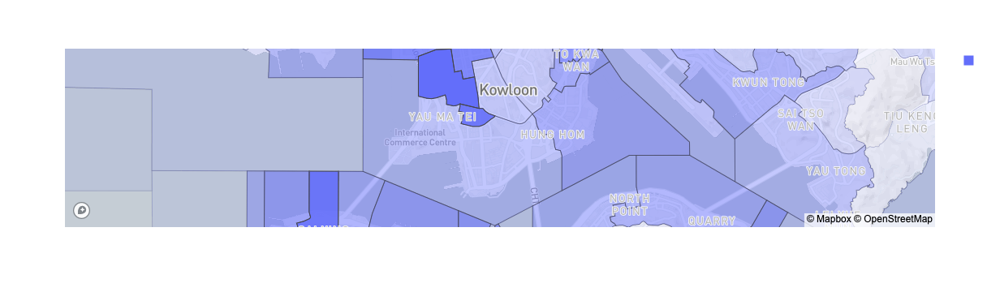

In [98]:
fig = px.choropleth_mapbox(df,
                           geojson=gpd.GeoSeries(df.geometry),
                           locations=df.index,
                           center={"lat": 22.3193, "lon": 114.1694},
                          mapbox_style="light",
                           hover_data = ["road_over_zoned"],
                          opacity = df.road_over_zoned / max(df.road_over_zoned))
fig.show()

In [55]:
df.to_excel("ha_district_road_over_zoned.xlsx")

# asthma prev by region

In [65]:
ha_dcca03_dict ＝ pd.read_excel("ha_dcca03_dict.xlsx")

asthma = pd.read_csv("../raw_data/cardiac_arrest.prev.regional.csv", 
                     index_col=0)
asthma = asthma.reset_index(drop = True)
asthma = asthma.rename(columns = {"District.of.Residence.Description": "district"})

In [66]:
asthma.head()

,district,n,total,prevalence
0,ABERDEEN,93,7231.0,0.012861
1,ADMIRALTY,1,19.0,0.052632
2,AP LEI CHAU,81,7430.0,0.010902
3,CAUSEWAY BAY,68,2364.0,0.028765
4,CENTRAL,16,998.0,0.016032


In [67]:
for i in range(len(asthma)):
    for j in range(len(ha_dcca03_dict)):
        for districtname in ha_dcca03_dict["Districtname"][j]:
            if asthma["district"][i] == districtname:
                asthma["district"][i] = ha_dcca03_dict["district"][j]

/var/folders/qj/hf26mvwj06q4f45ybdkdprgw0000gn/T/ipykernel_4902/535072086.py:5: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [68]:
asthma.district.unique().__len__()

115

In [70]:
asthma = asthma.groupby("district").aggregate({"n": sum, 
                               "total": sum})
asthma["prev"] = asthma["n"] / asthma["total"]

# merging with district map and road over zoned area %

In [71]:
df = district_gpd
df = pd.concat([df, pd.DataFrame({"road_over_zoned": road_over_zoned})], axis = 1)
df["road_over_zoned"] = round(df["road_over_zoned"], 3)
df = df.merge(asthma, how = "left", left_on = "Districtname", right_on = "district")

In [72]:
df.tail()

/Users/ytf1997/miniconda3/envs/ML_learn/lib/python3.10/site-packages/pandas/core/dtypes/inference.py:383: ShapelyDeprecationWarning:

Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.

/Users/ytf1997/miniconda3/envs/ML_learn/lib/python3.10/site-packages/pandas/core/dtypes/inference.py:384: ShapelyDeprecationWarning:

__len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.

/Users/ytf1997/miniconda3/envs/ML_learn/lib/python3.10/site-packages/pandas/io/formats/printing.py:117: ShapelyDeprecationWarning:

Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.

/Users/ytf1997/miniconda3/envs/ML_learn/lib/python3.10/site-packages/p

,Districtcode,geometry,Districtname,road_over_zoned,n,total,prev
113,WTS,POLYGON ((114.19610933685264 22.33831576660647...,WONG TAI SIN,0.232,344.0,6540.0,0.052599
114,WYT,"POLYGON ((114.3361895686625 22.56813109713753,...",WONG YUE TAN,0.028,5.0,541.0,0.009242
115,YL,(POLYGON ((114.03502962996073 22.4434140566542...,YUEN LONG,0.055,1207.0,45123.0,0.026749
116,YMT,POLYGON ((114.17066871333765 22.31298979120381...,YAU MA TEI,0.505,217.0,9035.0,0.024018
117,YYT,POLYGON ((114.16923076173643 22.33683294855551...,YAU YAT TSUEN,0.159,41.0,1305.0,0.031418


In [73]:
# df = df[df["prev"] < 0.015]

In [84]:
df["per_100"] = round(df["prev"] * 100, 3)

/var/folders/qj/hf26mvwj06q4f45ybdkdprgw0000gn/T/ipykernel_4902/3465543817.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [81]:
df = df[df["total"] >= 2500]

Text(0.5, 1.0, '2015-2021 regional cardiac arrest prevalence vs. road area percentage')

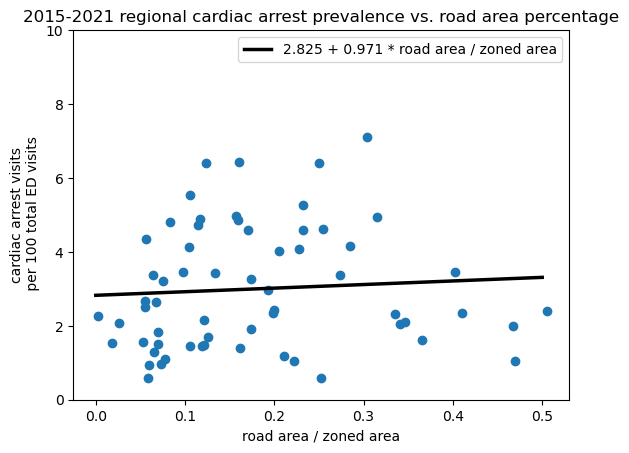

In [85]:
plt.scatter(df.road_over_zoned, df.per_100)
plt.ylim(top = 10, bottom = 0)
import numpy as np
idx = np.isfinite(df.road_over_zoned) & np.isfinite(df.per_100)
b, a = np.polyfit(df.road_over_zoned[idx], df.per_100[idx], deg=1)

# Create sequence of 100 numbers from 0 to .4
xseq = np.linspace(0, .5, num=100)

# Plot regression line
plt.plot(xseq, a + b * xseq, color="k", lw=2.5, 
         label = f"{round(a, 3)} + {round(b, 3)} * road area / zoned area")
plt.legend()
plt.xlabel("road area / zoned area")
plt.ylabel("cardiac arrest visits\n per 100 total ED visits")
plt.title("2015-2021 regional cardiac arrest prevalence vs. road area percentage")
# \n Region with total ED visits >= 2500 only")

In [87]:
len(df)

62

# plotly dashboard

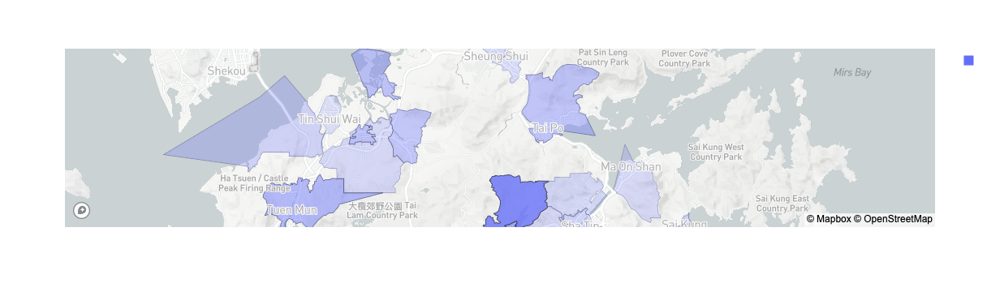

In [86]:
# fig2 = px.scatter_mapbox(df, 
#                      geojson = df.geometry,
#                      hover_name="Districtname",
#                         )
map_df = df.set_index("Districtname")
fig2 = px.choropleth_mapbox(map_df,
                           geojson=gpd.GeoSeries(map_df.geometry),
                            hover_data = ["road_over_zoned", "per_100"],
                           locations=map_df.index,
                            
                           center={"lat": 22.3193, "lon": 114.1694},
                          mapbox_style="light",
                          opacity = map_df.per_100 / max(map_df.per_100))
fig2.show()

In [91]:
fig2.write_html("ha_district_cardiac_arrest.html")